In [3]:
#Import modules
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.data import sampler

import torchvision.datasets as dset
import torchvision.transforms as T

import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

import utils.Models as models
from utils.show_results import show_tensor_comparison, show_pictures, evaluate_inpainter
from utils.load_save import save_weights, load_weights


In [4]:
NUM_TRAIN = 64*2000
batch_size= 64
percent_train = 0.9


# Need to compress Places365 Images to 128 x 128 for our architecture
train_transform = transform = T.Compose([
                T.ToTensor(),
                T.Resize((128,128), antialias=True),
            ])

# We set up a Dataset object for each split (train / val / test); Datasets load
# training examples one at a time, so we wrap each Dataset in a DataLoader which
# iterates through the Dataset and forms mini-batches. We divide the CIFAR-100
# training set into train and val sets by passing a Sampler object to the
# DataLoader telling how it should sample from the underlying Dataset.

places365_train = dset.Places365('./places365', small=True, transform=train_transform)

total_num_img = len(places365_train.imgs)
NUM_TRAIN = int(total_num_img*percent_train)


loader_train = DataLoader(places365_train, batch_size=batch_size, num_workers=2,
                          sampler=sampler.SubsetRandomSampler(range(NUM_TRAIN)))

loader_val = DataLoader(places365_train, batch_size=batch_size, num_workers=0,
                          sampler=sampler.SubsetRandomSampler(range(NUM_TRAIN, total_num_img)))

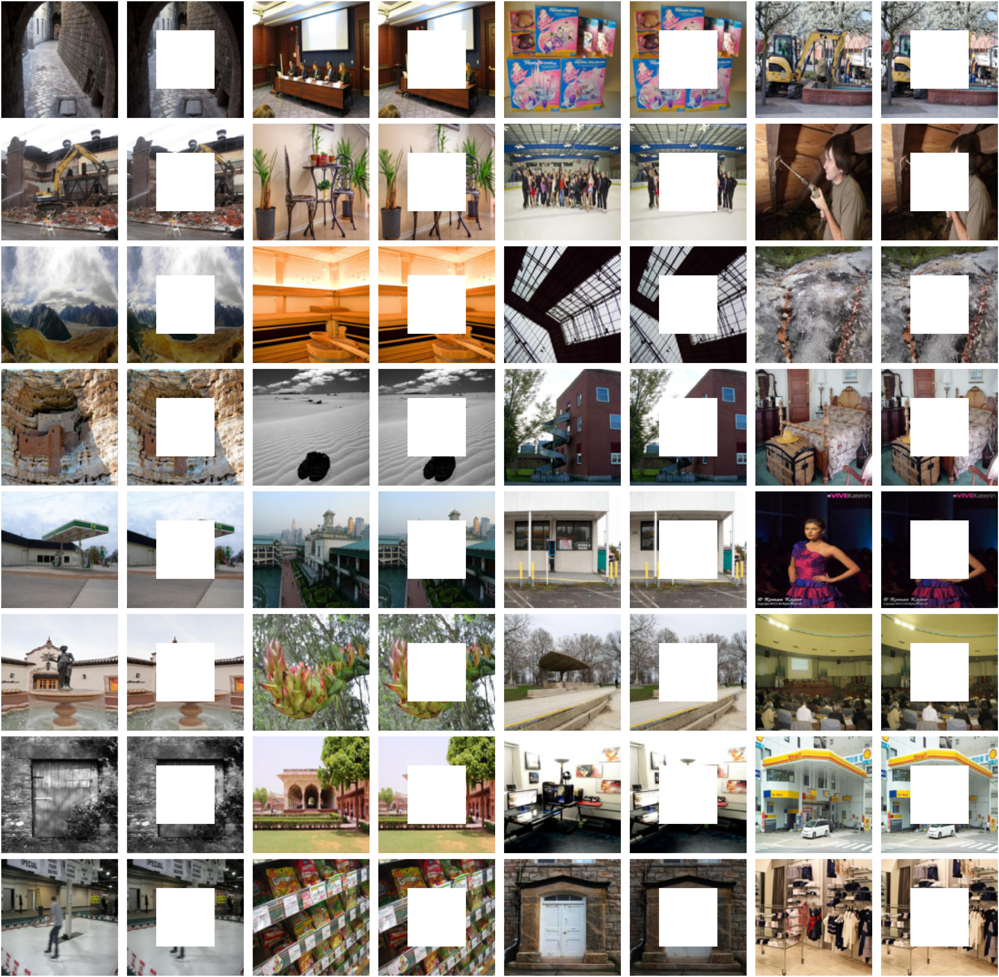

In [3]:
show_pictures(loader_train)

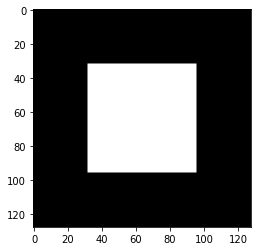

In [5]:
# center crop mask
mask_tensor = torch.zeros([3, 128, 128])
mask_tensor[:, 32:96, 32:96] = 1
plt.imshow(mask_tensor.permute(1, 2, 0))

In [5]:
def train_model(inpainter, discriminator, dataloader, num_epochs=2, learning_rate=0.0002, beta1=0.5, beta2=0.999):
    with torch.autograd.set_detect_anomaly(True):
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        print("Using device: " + device.type)
        
        #Set Learning rates for our total loss
        l_rec = 0.999
        l_adv = 0.001

        overlap = 4
        
        inpainter.to(device)
        discriminator.to(device)

        inpainter.train()
        discriminator.train()

        #Create mask to remove center region
        mask_tensor = torch.ones([3, 128, 128], requires_grad=False)
        mask_tensor[:, 32:96, 32:96] = 0
        mask_tensor.to(device)
        # define Loss Criterions
        inpaint_criterion = nn.MSELoss().to(device)
        discrim_criterion = nn.BCELoss().to(device)

        # define optimizer for context encoder
        optimizer_inp = optim.Adam(inpainter.parameters(), lr=learning_rate, betas=(beta1, beta2))

        # define optimizer for discriminator
        optimizer_dis = optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(beta1, beta2))

        for epoch in range(num_epochs):

            epoch_loss = 0.0
            num_samples = 0
            loop = tqdm(enumerate(dataloader), total=len(dataloader))
            for batch_idx, (imgs, _) in loop:

                imgs.to(device)


                #Get Center 64 x 64 of the 128 x 128 images
                center_imgs = imgs[:, :, 32:96, 32:96].to(device)

                #Transform the imgs using the center mask
                masked_imgs = imgs[:]
                
                # use the mask values used in the original paper's implementation in lua
                masked_imgs = masked_imgs.to(device)
                masked_imgs[:, 0, 32+overlap:96-overlap, 32+overlap:96-overlap] = 2*117.0/255.0 - 1.0
                masked_imgs[:, 1, 32+overlap:96-overlap, 32+overlap:96-overlap] = 2*104.0/255.0 - 1.0
                masked_imgs[:, 2, 32+overlap:96-overlap, 32+overlap:96-overlap] = 2*123.0/255.0 - 1.0
                
 

                # create labels for real and fake images
                real_labels = torch.ones((imgs.size(0), 1, 1, 1)).to(device)
                fake_labels = torch.zeros((imgs.size(0), 1, 1, 1)).to(device)

                # train discriminator with real images
                optimizer_dis.zero_grad()
                real_decisions = discriminator(center_imgs)
                loss_real = discrim_criterion(real_decisions, real_labels)

                # train discriminator with fake images
                fake_outputs = inpainter(masked_imgs)
                fake_decisions = discriminator(fake_outputs.detach())
                loss_fake = discrim_criterion(fake_decisions, fake_labels)

                #Compute and step discriminator loss
                loss_dis = (loss_real + loss_fake)
                loss_dis.backward()
                optimizer_dis.step()


                # train context encoder
                optimizer_inp.zero_grad()

                #Compute the reconstruction loss
#                 inpainter_outputs = inpainter(masked_imgs)
                
                #Compute Weighted L2 loss placing 10x loss on the edges
                weighted_matrix = center_imgs.clone()
                weighted_matrix.fill_(10)
                weighted_matrix[:,:, overlap:64-overlap, overlap:64-overlap] = 1
        
                loss_rec = (fake_outputs - center_imgs).pow(2)
                loss_rec = loss_rec * weighted_matrix
                loss_rec = loss_rec.mean()

                # Compute Adversarial Loss
                adv_fake_outputs = discriminator(fake_outputs)
                loss_adv = discrim_criterion(adv_fake_outputs, fake_labels)




                # Compute Total Loss
                loss_total = l_rec*loss_rec + l_adv*loss_adv

                loss_total.backward()
                optimizer_inp.step()


                # update progres bar
                loop.set_description(f"Epoch[{epoch}/{num_epochs}]")
                loop.set_postfix(loss_total=loss_total.item(), loss_dis=loss_dis.item(), loss_rec=loss_rec.item())

                # accumulate the batch loss and the number of samples processed
                batch_size = imgs.size(0)
                epoch_loss += loss_total.item() * batch_size
                num_samples += batch_size

                #save weights every 100 indeces
                if batch_idx % 1000 == 0:
                    save_weights(inpainter, discriminator, path= "./weights/")
                    print(f"Processed {batch_idx+1} batches, epoch loss: {epoch_loss/num_samples}")
                   
                
            save_weights(inpainter, discriminator, path= "./weights/")
            print('Epoch [%d/%d], Context Encoder Loss: %.4f'
                  % (epoch+1, num_epochs, epoch_loss/num_samples))



        print('Finished Training')
    

In [9]:
# Load the model weights from memory
model, discriminator = load_weights()
# model = models.ContextInpainter()
# discriminator = models.AdversarialDiscriminator()

In [7]:
train_model(model, discriminator, loader_train, num_epochs=4)

Using device: cuda


Epoch[0/4]:   0%|          | 1/25362 [00:08<62:38:04,  8.89s/it, loss_dis=1.35, loss_rec=1.48, loss_total=1.48]

Processed 1 batches, epoch loss: 1.4798951148986816


Epoch[0/4]:   4%|▍         | 1001/25362 [04:43<3:02:09,  2.23it/s, loss_dis=0.000432, loss_rec=0.0463, loss_total=0.0462]

Processed 1001 batches, epoch loss: 0.07086739580441903


Epoch[0/4]:   8%|▊         | 2001/25362 [09:24<2:52:25,  2.26it/s, loss_dis=3.69e-5, loss_rec=0.0401, loss_total=0.0401] 

Processed 2001 batches, epoch loss: 0.05745594445308824


Epoch[0/4]:  12%|█▏        | 3001/25362 [14:03<2:41:44,  2.30it/s, loss_dis=5.31e-5, loss_rec=0.0401, loss_total=0.0401] 

Processed 3001 batches, epoch loss: 0.05168956400245001


Epoch[0/4]:  16%|█▌        | 4001/25362 [18:40<2:37:06,  2.27it/s, loss_dis=5.32e-5, loss_rec=0.041, loss_total=0.041]   

Processed 4001 batches, epoch loss: 0.04840376873385888


Epoch[0/4]:  20%|█▉        | 5001/25362 [23:19<2:24:34,  2.35it/s, loss_dis=2.87e-5, loss_rec=0.0358, loss_total=0.0358] 

Processed 5001 batches, epoch loss: 0.04614310222589429


Epoch[0/4]:  24%|██▎       | 6001/25362 [27:58<2:22:20,  2.27it/s, loss_dis=0.000185, loss_rec=0.0396, loss_total=0.0396]

Processed 6001 batches, epoch loss: 0.044441981463655994


Epoch[0/4]:  28%|██▊       | 7001/25362 [32:37<2:11:36,  2.33it/s, loss_dis=1.39e-6, loss_rec=0.0328, loss_total=0.0328] 

Processed 7001 batches, epoch loss: 0.04313030179817197


Epoch[0/4]:  32%|███▏      | 8001/25362 [37:14<2:07:24,  2.27it/s, loss_dis=7.59e-5, loss_rec=0.0368, loss_total=0.0368] 

Processed 8001 batches, epoch loss: 0.04205937075644355


Epoch[0/4]:  35%|███▌      | 9001/25362 [41:54<1:56:49,  2.33it/s, loss_dis=1.22e-5, loss_rec=0.0331, loss_total=0.0331] 

Processed 9001 batches, epoch loss: 0.0411479974277512


Epoch[0/4]:  39%|███▉      | 10001/25362 [46:41<1:58:04,  2.17it/s, loss_dis=5.83e-7, loss_rec=0.0327, loss_total=0.0327]

Processed 10001 batches, epoch loss: 0.04037086032599184


Epoch[0/4]:  43%|████▎     | 11001/25362 [51:20<1:49:01,  2.20it/s, loss_dis=2.51e-6, loss_rec=0.0351, loss_total=0.0351] 

Processed 11001 batches, epoch loss: 0.03970553518105568


Epoch[0/4]:  47%|████▋     | 12001/25362 [55:59<1:45:08,  2.12it/s, loss_dis=6.67e-6, loss_rec=0.033, loss_total=0.033]   

Processed 12001 batches, epoch loss: 0.03909606138614752


Epoch[0/4]:  51%|█████▏    | 13001/25362 [1:00:38<1:31:22,  2.25it/s, loss_dis=2.32e-5, loss_rec=0.0277, loss_total=0.0277] 

Processed 13001 batches, epoch loss: 0.03855292082051228


Epoch[0/4]:  55%|█████▌    | 14001/25362 [1:05:17<1:24:39,  2.24it/s, loss_dis=7.58e-6, loss_rec=0.0298, loss_total=0.0298] 

Processed 14001 batches, epoch loss: 0.03807842029920732


Epoch[0/4]:  59%|█████▉    | 15001/25362 [1:09:56<1:20:59,  2.13it/s, loss_dis=2.47e-7, loss_rec=0.0329, loss_total=0.0329]

Processed 15001 batches, epoch loss: 0.03763297941200706


Epoch[0/4]:  63%|██████▎   | 16001/25362 [1:14:35<1:10:07,  2.22it/s, loss_dis=2.92e-7, loss_rec=0.025, loss_total=0.025]  

Processed 16001 batches, epoch loss: 0.037228517315229


Epoch[0/4]:  67%|██████▋   | 17001/25362 [1:19:15<1:02:59,  2.21it/s, loss_dis=5.28e-8, loss_rec=0.0298, loss_total=0.0297]

Processed 17001 batches, epoch loss: 0.03686579574519842


Epoch[0/4]:  71%|███████   | 18001/25362 [1:23:54<53:50,  2.28it/s, loss_dis=3.18e-8, loss_rec=0.0311, loss_total=0.0311]  

Processed 18001 batches, epoch loss: 0.03651853057092133


Epoch[0/4]:  75%|███████▍  | 19001/25362 [1:28:34<47:12,  2.25it/s, loss_dis=1.64e-6, loss_rec=0.0276, loss_total=0.0276] 

Processed 19001 batches, epoch loss: 0.03620625155043739


Epoch[0/4]:  79%|███████▉  | 20001/25362 [1:33:13<39:55,  2.24it/s, loss_dis=1.28e-7, loss_rec=0.0252, loss_total=0.0252] 

Processed 20001 batches, epoch loss: 0.035908821840683884


Epoch[0/4]:  83%|████████▎ | 21001/25362 [1:37:52<33:26,  2.17it/s, loss_dis=4.67e-8, loss_rec=0.0259, loss_total=0.0259] 

Processed 21001 batches, epoch loss: 0.03563291862256487


Epoch[0/4]:  87%|████████▋ | 22001/25362 [1:42:33<25:50,  2.17it/s, loss_dis=4.41e-9, loss_rec=0.0287, loss_total=0.0286] 

Processed 22001 batches, epoch loss: 0.035378763589917095


Epoch[0/4]:  91%|█████████ | 23001/25362 [1:47:13<18:06,  2.17it/s, loss_dis=6.05e-7, loss_rec=0.0302, loss_total=0.0302] 

Processed 23001 batches, epoch loss: 0.035133619152239795


Epoch[0/4]:  95%|█████████▍| 24001/25362 [1:51:54<10:26,  2.17it/s, loss_dis=1.47e-12, loss_rec=0.0326, loss_total=0.0326]

Processed 24001 batches, epoch loss: 0.03490480178464458


Epoch[0/4]:  99%|█████████▊| 25001/25362 [1:56:34<02:40,  2.25it/s, loss_dis=1.18e-10, loss_rec=0.03, loss_total=0.03]    

Processed 25001 batches, epoch loss: 0.034685557446341254


Epoch[0/4]: 100%|██████████| 25362/25362 [1:58:19<00:00,  3.57it/s, loss_dis=1.65e-9, loss_rec=0.0333, loss_total=0.0332] 


Epoch [1/4], Context Encoder Loss: 0.0346


Epoch[1/4]:   0%|          | 1/25362 [00:01<8:51:44,  1.26s/it, loss_dis=9.23e-9, loss_rec=0.0296, loss_total=0.0296]

Processed 1 batches, epoch loss: 0.02957758866250515


Epoch[1/4]:   4%|▍         | 1001/25362 [04:34<2:56:05,  2.31it/s, loss_dis=2e-7, loss_rec=0.0323, loss_total=0.0322]   

Processed 1001 batches, epoch loss: 0.029235907220891068


Epoch[1/4]:   8%|▊         | 2001/25362 [09:14<2:56:44,  2.20it/s, loss_dis=4.94e-6, loss_rec=0.0299, loss_total=0.0299] 

Processed 2001 batches, epoch loss: 0.029103993403277118


Epoch[1/4]:  12%|█▏        | 3001/25362 [13:56<2:44:07,  2.27it/s, loss_dis=2.17e-8, loss_rec=0.0306, loss_total=0.0306] 

Processed 3001 batches, epoch loss: 0.029005252310223516


Epoch[1/4]:  16%|█▌        | 4001/25362 [18:39<2:39:10,  2.24it/s, loss_dis=1.77e-12, loss_rec=0.0272, loss_total=0.0272]

Processed 4001 batches, epoch loss: 0.028921771141398076


Epoch[1/4]:  20%|█▉        | 5001/25362 [23:18<2:25:42,  2.33it/s, loss_dis=1.34e-8, loss_rec=0.0284, loss_total=0.0284] 

Processed 5001 batches, epoch loss: 0.028862911040941804


Epoch[1/4]:  24%|██▎       | 6001/25362 [27:55<2:20:48,  2.29it/s, loss_dis=1.42e-5, loss_rec=0.0296, loss_total=0.0296] 

Processed 6001 batches, epoch loss: 0.028812861988788702


Epoch[1/4]:  28%|██▊       | 7001/25362 [32:31<2:17:48,  2.22it/s, loss_dis=1.56e-9, loss_rec=0.0251, loss_total=0.0251] 

Processed 7001 batches, epoch loss: 0.028761041274704247


Epoch[1/4]:  32%|███▏      | 8001/25362 [37:08<2:08:48,  2.25it/s, loss_dis=1.88e-14, loss_rec=0.0283, loss_total=0.0282]

Processed 8001 batches, epoch loss: 0.028704043882615552


Epoch[1/4]:  35%|███▌      | 9001/25362 [41:45<2:02:19,  2.23it/s, loss_dis=1.9e-7, loss_rec=0.0328, loss_total=0.0328]  

Processed 9001 batches, epoch loss: 0.028657765318411427


Epoch[1/4]:  39%|███▉      | 10001/25362 [46:22<1:54:00,  2.25it/s, loss_dis=2.22e-18, loss_rec=0.0263, loss_total=0.0263]

Processed 10001 batches, epoch loss: 0.02861812161280774


Epoch[1/4]:  43%|████▎     | 11001/25362 [51:02<1:43:00,  2.32it/s, loss_dis=1e-9, loss_rec=0.0275, loss_total=0.0275]    

Processed 11001 batches, epoch loss: 0.028557792040797517


Epoch[1/4]:  47%|████▋     | 12001/25362 [55:40<1:39:36,  2.24it/s, loss_dis=3.42e-14, loss_rec=0.0291, loss_total=0.029] 

Processed 12001 batches, epoch loss: 0.028509252654159926


Epoch[1/4]:  51%|█████▏    | 13001/25362 [1:00:18<1:32:42,  2.22it/s, loss_dis=1.61e-16, loss_rec=0.0266, loss_total=0.0266]

Processed 13001 batches, epoch loss: 0.02847094732143931


Epoch[1/4]:  55%|█████▌    | 14001/25362 [1:04:56<1:23:58,  2.25it/s, loss_dis=2.13e-12, loss_rec=0.0275, loss_total=0.0275]

Processed 14001 batches, epoch loss: 0.02842075204076673


Epoch[1/4]:  59%|█████▉    | 15001/25362 [1:09:34<1:14:07,  2.33it/s, loss_dis=8.7e-16, loss_rec=0.0249, loss_total=0.0249] 

Processed 15001 batches, epoch loss: 0.028378068927707025


Epoch[1/4]:  63%|██████▎   | 16001/25362 [1:14:12<1:09:01,  2.26it/s, loss_dis=2.54e-8, loss_rec=0.0262, loss_total=0.0261] 

Processed 16001 batches, epoch loss: 0.028329724497042196


Epoch[1/4]:  67%|██████▋   | 17001/25362 [1:18:51<1:02:32,  2.23it/s, loss_dis=8.5e-12, loss_rec=0.027, loss_total=0.0269]  

Processed 17001 batches, epoch loss: 0.028287607134326362


Epoch[1/4]:  71%|███████   | 18001/25362 [1:23:30<54:47,  2.24it/s, loss_dis=8.02e-11, loss_rec=0.0256, loss_total=0.0255]  

Processed 18001 batches, epoch loss: 0.028240027348279396


Epoch[1/4]:  75%|███████▍  | 19001/25362 [1:28:08<48:04,  2.21it/s, loss_dis=3.08e-13, loss_rec=0.0285, loss_total=0.0285]

Processed 19001 batches, epoch loss: 0.02820071137935342


Epoch[1/4]:  79%|███████▉  | 20001/25362 [1:32:47<41:43,  2.14it/s, loss_dis=5.51e-13, loss_rec=0.0284, loss_total=0.0284]

Processed 20001 batches, epoch loss: 0.028162204236046214


Epoch[1/4]:  83%|████████▎ | 21001/25362 [1:37:26<33:29,  2.17it/s, loss_dis=1.57e-12, loss_rec=0.0279, loss_total=0.0279]

Processed 21001 batches, epoch loss: 0.028127143013963223


Epoch[1/4]:  87%|████████▋ | 22001/25362 [1:42:06<25:42,  2.18it/s, loss_dis=8.5e-16, loss_rec=0.0286, loss_total=0.0286] 

Processed 22001 batches, epoch loss: 0.028090918330565175


Epoch[1/4]:  91%|█████████ | 23001/25362 [1:46:46<16:54,  2.33it/s, loss_dis=5.85e-12, loss_rec=0.0276, loss_total=0.0275]

Processed 23001 batches, epoch loss: 0.028053265439330156


Epoch[1/4]:  95%|█████████▍| 24001/25362 [1:51:27<09:52,  2.30it/s, loss_dis=2.02e-14, loss_rec=0.0251, loss_total=0.0251]

Processed 24001 batches, epoch loss: 0.028015197144709455


Epoch[1/4]:  99%|█████████▊| 25001/25362 [1:56:06<02:40,  2.25it/s, loss_dis=1.37e-7, loss_rec=0.0258, loss_total=0.0258] 

Processed 25001 batches, epoch loss: 0.02797864205292795


Epoch[1/4]: 100%|██████████| 25362/25362 [1:57:49<00:00,  3.59it/s, loss_dis=8.54e-11, loss_rec=0.0441, loss_total=0.044] 


Epoch [2/4], Context Encoder Loss: 0.0280


Epoch[2/4]:   0%|          | 1/25362 [00:01<9:45:24,  1.38s/it, loss_dis=2.23e-7, loss_rec=0.0341, loss_total=0.0341]

Processed 1 batches, epoch loss: 0.0341133251786232


Epoch[2/4]:   4%|▍         | 1001/25362 [04:34<2:58:24,  2.28it/s, loss_dis=9.54e-14, loss_rec=0.0266, loss_total=0.0266]

Processed 1001 batches, epoch loss: 0.026769940922786662


Epoch[2/4]:   8%|▊         | 2001/25362 [09:09<2:47:17,  2.33it/s, loss_dis=6.91e-11, loss_rec=0.0248, loss_total=0.0248]

Processed 2001 batches, epoch loss: 0.026761866714069986


Epoch[2/4]:  12%|█▏        | 3001/25362 [13:45<2:45:25,  2.25it/s, loss_dis=8.23e-11, loss_rec=0.025, loss_total=0.025]  

Processed 3001 batches, epoch loss: 0.02673129242388994


Epoch[2/4]:  16%|█▌        | 4001/25362 [18:21<2:35:02,  2.30it/s, loss_dis=2.81e-10, loss_rec=0.0289, loss_total=0.0289]

Processed 4001 batches, epoch loss: 0.0267469494551666


Epoch[2/4]:  20%|█▉        | 5001/25362 [22:58<2:31:11,  2.24it/s, loss_dis=1.54e-9, loss_rec=0.0245, loss_total=0.0245] 

Processed 5001 batches, epoch loss: 0.02671820580008816


Epoch[2/4]:  24%|██▎       | 6001/25362 [27:34<2:19:17,  2.32it/s, loss_dis=3.24e-12, loss_rec=0.0265, loss_total=0.0265]

Processed 6001 batches, epoch loss: 0.026699225621108928


Epoch[2/4]:  28%|██▊       | 7001/25362 [32:11<2:15:20,  2.26it/s, loss_dis=1.46e-10, loss_rec=0.0287, loss_total=0.0287]

Processed 7001 batches, epoch loss: 0.02667590023314139


Epoch[2/4]:  32%|███▏      | 8001/25362 [36:47<2:03:20,  2.35it/s, loss_dis=8.48e-15, loss_rec=0.0284, loss_total=0.0284]

Processed 8001 batches, epoch loss: 0.026665001200625427


Epoch[2/4]:  35%|███▌      | 9001/25362 [41:23<2:01:24,  2.25it/s, loss_dis=1.77e-11, loss_rec=0.0272, loss_total=0.0272]

Processed 9001 batches, epoch loss: 0.02664571747729287


Epoch[2/4]:  39%|███▉      | 10001/25362 [45:59<1:54:45,  2.23it/s, loss_dis=8.58e-9, loss_rec=0.0272, loss_total=0.0272] 

Processed 10001 batches, epoch loss: 0.0266213631940006


Epoch[2/4]:  43%|████▎     | 11001/25362 [50:36<1:44:59,  2.28it/s, loss_dis=1.48e-9, loss_rec=0.0248, loss_total=0.0248] 

Processed 11001 batches, epoch loss: 0.02660790158310578


Epoch[2/4]:  47%|████▋     | 12001/25362 [55:13<1:40:29,  2.22it/s, loss_dis=3.79e-10, loss_rec=0.0248, loss_total=0.0248]

Processed 12001 batches, epoch loss: 0.026582378855599192


Epoch[2/4]:  51%|█████▏    | 13001/25362 [59:50<1:32:53,  2.22it/s, loss_dis=6.71e-9, loss_rec=0.0242, loss_total=0.0242] 

Processed 13001 batches, epoch loss: 0.026561043126444552


Epoch[2/4]:  55%|█████▌    | 14001/25362 [1:04:27<1:24:41,  2.24it/s, loss_dis=1.56e-9, loss_rec=0.0241, loss_total=0.0241]

Processed 14001 batches, epoch loss: 0.026545317852070746


Epoch[2/4]:  59%|█████▉    | 15001/25362 [1:09:05<1:16:50,  2.25it/s, loss_dis=1.57e-11, loss_rec=0.0273, loss_total=0.0273]

Processed 15001 batches, epoch loss: 0.026527384011838906


Epoch[2/4]:  63%|██████▎   | 16001/25362 [1:13:42<1:08:55,  2.26it/s, loss_dis=9.52e-10, loss_rec=0.0274, loss_total=0.0273]

Processed 16001 batches, epoch loss: 0.026501939502727404


Epoch[2/4]:  67%|██████▋   | 17001/25362 [1:18:20<1:02:27,  2.23it/s, loss_dis=2.34e-8, loss_rec=0.0236, loss_total=0.0235] 

Processed 17001 batches, epoch loss: 0.026477758763742008


Epoch[2/4]:  71%|███████   | 18001/25362 [1:22:58<55:04,  2.23it/s, loss_dis=6.6e-21, loss_rec=0.0259, loss_total=0.0259]   

Processed 18001 batches, epoch loss: 0.02646091866446289


Epoch[2/4]:  75%|███████▍  | 19001/25362 [1:27:36<46:59,  2.26it/s, loss_dis=1.88e-14, loss_rec=0.0264, loss_total=0.0264]

Processed 19001 batches, epoch loss: 0.026438937173341396


Epoch[2/4]:  79%|███████▉  | 20001/25362 [1:32:16<40:18,  2.22it/s, loss_dis=1.45e-17, loss_rec=0.0293, loss_total=0.0293]

Processed 20001 batches, epoch loss: 0.02641719227599821


Epoch[2/4]:  83%|████████▎ | 21001/25362 [1:36:55<32:04,  2.27it/s, loss_dis=1.53e-17, loss_rec=0.0237, loss_total=0.0236]

Processed 21001 batches, epoch loss: 0.026394004002036092


Epoch[2/4]:  87%|████████▋ | 22001/25362 [1:41:34<25:27,  2.20it/s, loss_dis=6.85e-17, loss_rec=0.0262, loss_total=0.0262]

Processed 22001 batches, epoch loss: 0.026379449755186374


Epoch[2/4]:  91%|█████████ | 23001/25362 [1:46:12<17:22,  2.26it/s, loss_dis=1.02e-12, loss_rec=0.025, loss_total=0.0249] 

Processed 23001 batches, epoch loss: 0.026359925357044497


Epoch[2/4]:  95%|█████████▍| 24001/25362 [1:50:52<09:53,  2.29it/s, loss_dis=4.87e-20, loss_rec=0.0238, loss_total=0.0237]

Processed 24001 batches, epoch loss: 0.026339193547931388


Epoch[2/4]:  99%|█████████▊| 25001/25362 [1:55:32<02:38,  2.28it/s, loss_dis=3.21e-17, loss_rec=0.0252, loss_total=0.0252]

Processed 25001 batches, epoch loss: 0.026316861962699674


Epoch[2/4]: 100%|██████████| 25362/25362 [1:57:14<00:00,  3.61it/s, loss_dis=8.14e-14, loss_rec=0.0284, loss_total=0.0284]


Epoch [3/4], Context Encoder Loss: 0.0263


Epoch[3/4]:   0%|          | 1/25362 [00:01<9:04:25,  1.29s/it, loss_dis=1.4e-14, loss_rec=0.0277, loss_total=0.0276]

Processed 1 batches, epoch loss: 0.027639063075184822


Epoch[3/4]:   4%|▍         | 1001/25362 [04:34<2:57:26,  2.29it/s, loss_dis=2.88e-16, loss_rec=0.0238, loss_total=0.0238]

Processed 1001 batches, epoch loss: 0.025464105660786163


Epoch[3/4]:   8%|▊         | 2001/25362 [09:09<2:51:54,  2.26it/s, loss_dis=5.47e-14, loss_rec=0.0238, loss_total=0.0238]

Processed 2001 batches, epoch loss: 0.0255155462375109


Epoch[3/4]:  12%|█▏        | 3001/25362 [13:44<2:41:58,  2.30it/s, loss_dis=4.97e-11, loss_rec=0.0232, loss_total=0.0232]

Processed 3001 batches, epoch loss: 0.025510845905724108


Epoch[3/4]:  16%|█▌        | 4001/25362 [18:19<2:40:25,  2.22it/s, loss_dis=5.18e-12, loss_rec=0.0273, loss_total=0.0272]

Processed 4001 batches, epoch loss: 0.025515719133707856


Epoch[3/4]:  20%|█▉        | 5001/25362 [22:54<2:30:16,  2.26it/s, loss_dis=2.2e-17, loss_rec=0.0267, loss_total=0.0266] 

Processed 5001 batches, epoch loss: 0.025496707561373164


Epoch[3/4]:  24%|██▎       | 6001/25362 [27:30<2:16:27,  2.36it/s, loss_dis=2.52e-12, loss_rec=0.0266, loss_total=0.0265]

Processed 6001 batches, epoch loss: 0.02548651312895515


Epoch[3/4]:  28%|██▊       | 7001/25362 [32:05<2:16:42,  2.24it/s, loss_dis=8.51e-11, loss_rec=0.0257, loss_total=0.0256]

Processed 7001 batches, epoch loss: 0.025466540348119453


Epoch[3/4]:  32%|███▏      | 8001/25362 [36:40<2:06:29,  2.29it/s, loss_dis=7.9e-11, loss_rec=0.0242, loss_total=0.0242] 

Processed 8001 batches, epoch loss: 0.02545543641541998


Epoch[3/4]:  35%|███▌      | 9001/25362 [41:16<2:03:28,  2.21it/s, loss_dis=5.76e-12, loss_rec=0.0255, loss_total=0.0255]

Processed 9001 batches, epoch loss: 0.025459365896469233


Epoch[3/4]:  39%|███▉      | 10001/25362 [45:52<1:49:01,  2.35it/s, loss_dis=9.17e-22, loss_rec=0.0272, loss_total=0.0272]

Processed 10001 batches, epoch loss: 0.025448351984482483


Epoch[3/4]:  43%|████▎     | 11001/25362 [50:27<1:45:48,  2.26it/s, loss_dis=3.02e-17, loss_rec=0.0249, loss_total=0.0249]

Processed 11001 batches, epoch loss: 0.025429427134764215


Epoch[3/4]:  47%|████▋     | 12001/25362 [55:03<1:39:48,  2.23it/s, loss_dis=4.23e-13, loss_rec=0.0261, loss_total=0.026] 

Processed 12001 batches, epoch loss: 0.025416071974402238


Epoch[3/4]:  51%|█████▏    | 13001/25362 [59:39<1:35:52,  2.15it/s, loss_dis=6.54e-20, loss_rec=0.0286, loss_total=0.0286]

Processed 13001 batches, epoch loss: 0.02541666248759259


Epoch[3/4]:  55%|█████▌    | 14001/25362 [1:04:15<1:22:59,  2.28it/s, loss_dis=2.1e-15, loss_rec=0.0251, loss_total=0.0251]

Processed 14001 batches, epoch loss: 0.02540529821764894


Epoch[3/4]:  59%|█████▉    | 15001/25362 [1:08:52<1:15:55,  2.27it/s, loss_dis=4.28e-19, loss_rec=0.0277, loss_total=0.0277]

Processed 15001 batches, epoch loss: 0.025397202872799268


Epoch[3/4]:  63%|██████▎   | 16001/25362 [1:13:29<1:11:38,  2.18it/s, loss_dis=1.37e-21, loss_rec=0.0238, loss_total=0.0238]

Processed 16001 batches, epoch loss: 0.025388640944052247


Epoch[3/4]:  67%|██████▋   | 17001/25362 [1:18:05<1:00:41,  2.30it/s, loss_dis=1.05e-14, loss_rec=0.025, loss_total=0.025]  

Processed 17001 batches, epoch loss: 0.025376964809237058


Epoch[3/4]:  71%|███████   | 18001/25362 [1:22:41<55:16,  2.22it/s, loss_dis=3.42e-21, loss_rec=0.0282, loss_total=0.0281]  

Processed 18001 batches, epoch loss: 0.02536695752265761


Epoch[3/4]:  75%|███████▍  | 19001/25362 [1:27:19<46:54,  2.26it/s, loss_dis=9.1e-21, loss_rec=0.0249, loss_total=0.0249] 

Processed 19001 batches, epoch loss: 0.02535839663166293


Epoch[3/4]:  79%|███████▉  | 20001/25362 [1:31:56<39:50,  2.24it/s, loss_dis=1.54e-18, loss_rec=0.0244, loss_total=0.0244]

Processed 20001 batches, epoch loss: 0.025345290366452753


Epoch[3/4]:  83%|████████▎ | 21001/25362 [1:36:34<32:47,  2.22it/s, loss_dis=3.44e-18, loss_rec=0.0251, loss_total=0.0251]

Processed 21001 batches, epoch loss: 0.025336088249122386


Epoch[3/4]:  87%|████████▋ | 22001/25362 [1:41:12<24:09,  2.32it/s, loss_dis=4.79e-17, loss_rec=0.0247, loss_total=0.0247]

Processed 22001 batches, epoch loss: 0.02532397897476435


Epoch[3/4]:  91%|█████████ | 23001/25362 [1:45:50<17:26,  2.26it/s, loss_dis=1.13e-17, loss_rec=0.0254, loss_total=0.0254]

Processed 23001 batches, epoch loss: 0.025316901999544717


Epoch[3/4]:  95%|█████████▍| 24001/25362 [1:50:29<09:53,  2.30it/s, loss_dis=6.1e-12, loss_rec=0.0246, loss_total=0.0246] 

Processed 24001 batches, epoch loss: 0.025305560338678947


Epoch[3/4]:  99%|█████████▊| 25001/25362 [1:55:08<02:42,  2.23it/s, loss_dis=2.12e-10, loss_rec=0.0261, loss_total=0.026] 

Processed 25001 batches, epoch loss: 0.02529724527611267


Epoch[3/4]: 100%|██████████| 25362/25362 [1:56:49<00:00,  3.62it/s, loss_dis=4.22e-13, loss_rec=0.0319, loss_total=0.0319]


Epoch [4/4], Context Encoder Loss: 0.0253
Finished Training


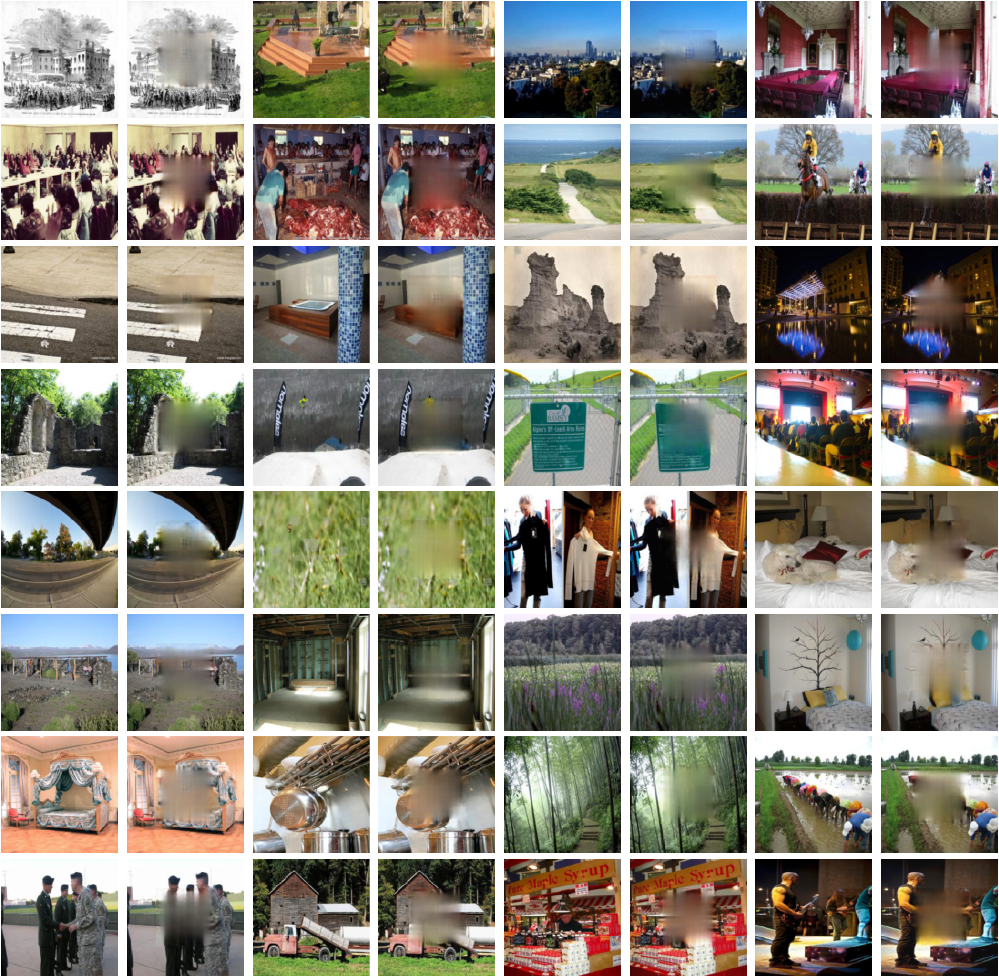

<Figure size 432x288 with 0 Axes>

In [7]:
evaluate_inpainter(model, loader_train)


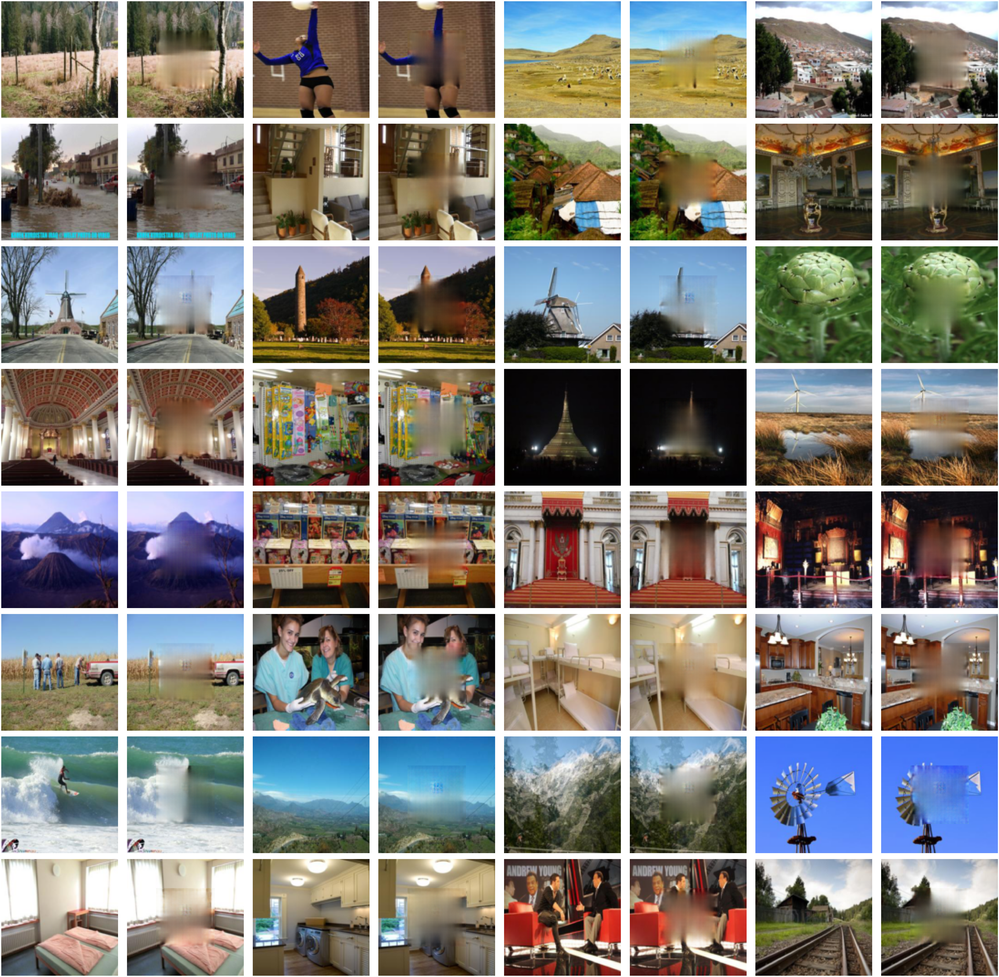

<Figure size 432x288 with 0 Axes>

In [8]:
evaluate_inpainter(model, loader_val)
